<a href="https://colab.research.google.com/github/bholagautam99/git-github-basics/blob/main/Assignment2_BholaGautamFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Chemical Applications of Machine Learning (CHEM 4930/5610) - Spring 2026

### Assignment 2 - Deadline 2/3/2026
Points 10

#### General Comments
All figures and graph should have approriate labels on the two axis, and should include a legend with appropriate labels of the different plots.

The notebook should be return in working format. That is, I should be able to reset all the output and re-run all the cells and get the same results as you obtained.

**You should start by saving a copy of the notebook to your Google Drive so you preserve all changes.**

**Please add your name as a suffix to the filname**

**Student Name**: Bhola Gautam
1.   List item
2.   List item



**AI usage statement:**
ChatGPT was used to help generate and debug code, explain programming logic, and suggest implementation approaches. All code was reviewed, adapted, and executed by the student, and the final results reflect the student’s own understanding.

### Task 1 - 10 points

In this task, we will consider the Bradley Melting Point Dataset, which is curated chemical dataset with melting points of around 3,000 chemical compounds, see [here](https://www.kaggle.com/datasets/aliffaagnur/melting-point-chemical-dataset/data).

This dataset is stored in a comma-separated values (csv) file, which is common format used to start data in text files. We can load this into a pandas DataFrame using the `load_csv` function.

In this dataset, we have the compounds names, SMILES strings, and the melting point in Celsius.

#### A)
Identify in the dataset the chemical compounds with the 5 lowest melting points and 5 highest melting points and visualize their 2D chemical structure using RDKit and the [mols2grid package](https://mols2grid.readthedocs.io/en/latest/), where you display the melting point values on the grid, see [here](https://colab.research.google.com/github/PatWalters/practical_cheminformatics_tutorials/blob/main/fundamentals/A_Whirlwind_Introduction_To_The_RDKit.ipynb#scrollTo=N3CR7rMF3sg7) for an example of the usage of mols2grid.

#### B)
Calculate the following properties for the molecules using RDKIt:
- The molecular weight
- The number of heavy atoms
- Number of hydrogen bond acceptors
- Number of hydrogen bond donors
- [Octanol-water partition coefficient - LogP](https://pubs-acs-org.libproxy.library.unt.edu/doi/10.1021/ci990307l)
- [Topological polar surface area (TPSA) descriptor](https://pubs-acs-org.libproxy.library.unt.edu/doi/abs/10.1021/jm000942e)
- Topological polar surface area (TPSA) descriptor, including S and P atoms, see [here](https://www.rdkit.org/docs/RDKit_Book.html#implementation-of-the-tpsa-descriptor)

Note: for some of the molecules, the TPSA descriptor will give a value of zero. When doing any analysis for the TPSA descriptor, you should ignore these values.

#### C)
Write out to a new csv file values of all the properties calculated in B) along with the compound names, SMILES strings, and the melting point in Celsius. Here, when writing this file, you should ignore any compounds where the SMILES conversion did not work correctly.

#### D)
Perform a linear regression analysis using scikit-learn where you look at the correlation of each of the properties calculated in B) with melting temperature. Here, each property should be considered individually.

To avoid outliers, filter out (i.e., remove) the compounds with the lowest 10% and the highest 10% melting temperature. Make a histogram that shows this filtering. Furthermore, for each property, filter out the compounds with lowest 10% and highest 10% values (again making a histogram that shows this filtering). Only consider the joint remaining compounds in your linear regression analysis for each property.

When performing the linear regression, employ a 70%/30% training/test split.

Calculate the coefficient of determination, $R^2$, for both the training dataset and the test dataset and report both.

You should make figure that shows the data along with the linear curve coming from the linear regression. In the figure, it should be clear which data points are in the training and test set (e.g., by having them in different colors). Include the $R^2$ values on the figure.

From your analysis, which of the properties correlates best with the melting temperature?

#### E)
For two of the properties from D) (e.g., the ones that correlate best with the melting point), perform [RANSAC](https://en.wikipedia.org/wiki/Random_sample_consensus) regression, which is method that takes outliers into account when performing linear regression and does not include them in the final modeling, see [here](https://scikit-learn.org/stable/auto_examples/linear_model/plot_ransac.html).

In the figure, it should be clear which data points are in inlier set and which are in the outlier set (e.g., by showing them in different colors).


In [ ]:
# Bash script to download all the dataset. Don't worry if you don't understand it
%%bash

url="https://raw.githubusercontent.com/valsson-group/UNT-ChemicalApplicationsOfMachineLearning-Spring2026/refs/heads/main/Assignment-2/"
dataset_filename="BradleyDoublePlusGoodMeltingPointDataset.csv"

rm -f ${dataset_filename}

wget ${url}/${dataset_filename} &> /dev/null

ls

BradleyDoublePlusGoodMeltingPointDataset.csv
sample_data


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


In [ ]:
# the %%capture command will surpress output to screen
#%%capture
!pip install rdkit mols2grid

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.6/36.6 MB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.3 MB/s eta 0:00:00


In [ ]:
from rdkit import Chem

In [ ]:
data_mp = pd.read_csv("BradleyDoublePlusGoodMeltingPointDataset.csv")

In [ ]:
data_mp

,key,name,smiles,mpC,csid,link,source,count,min,max,range
0,27956,cyclobutylmethane,C1(CCC1)C,-161.51,11232,http://pubs.acs.org/doi/abs/10.1021/ja01142a048,Lemaire HP; Livingston RL Journal of the Ameri...,2,-161.51,-161.5,0.01
1,16005,Nitrogen oxide,[O-][N+]#N,-90.80,923,http://msds.chem.ox.ac.uk/,academic website,2,-90.81,-90.8,0.01
2,16127,Sulfuryl difluoride,FS(F)(=O)=O,-135.80,16647,http://msds.chem.ox.ac.uk/,academic website,2,-135.82,-135.8,0.02
3,17138,disopyramide,CC(C)N(CCC(c1ccccn1)(c2ccccc2)C(N)=O)C(C)C,94.80,3002,http://dx.doi.org/10.1021/ci700307p,Hughes LD; Palmer DS; Nigsch F and Mitchell JB...,2,94.75,94.8,0.05
4,15628,Bromine,BrBr,-7.20,22817,http://msds.chem.ox.ac.uk/,academic website,2,-7.25,-7.2,0.05
...,...,...,...,...,...,...,...,...,...,...,...
3036,27698,4-Nitrobenzoic acid,C1=CC(=CC=C1C(=O)O)[N+](=O)[O-],240.00,5882,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,6,237.00,242.0,5.00
3037,28584,Thalidomide,C1CC(=O)NC(=O)C1N2C(=O)C3=CC=CC=C3C2=O,275.00,5233,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,7,270.00,275.0,5.00
3038,28068,Estradiol,C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@@H]2O)CCC4=C3...,176.00,5554,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,7,173.00,178.0,5.00
3039,27580,"2,4,6-Trichlorophenol",C1=C(C=C(C(=C1Cl)O)Cl)Cl,65.00,21106172,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,9,65.00,70.0,5.00


In [ ]:
print(list(data_mp.keys()))

['key', 'name', 'smiles', 'mpC', 'csid', 'link', 'source', 'count', 'min', 'max', 'range']


In [ ]:
melting_point_C = data_mp['mpC']
print(melting_point_C)

0      -161.51
1       -90.80
2      -135.80
3        94.80
4        -7.20
         ...  
3036    240.00
3037    275.00
3038    176.00
3039     65.00
3040    -34.00
Name: mpC, Length: 3041, dtype: float64


In [ ]:
indices_5_lowest = np.argpartition(melting_point_C,5)[:5]
print(indices_5_lowest)

[375 102 303 345 821]


In [ ]:
data_mp.describe()

,key,mpC,csid,count,min,max,range
count,3041.000000,3041.000000,3.041000e+03,3041.000000,3041.000000,3041.000000,3041.000000
mean,10771.570865,62.848159,2.027796e+06,2.798422,62.229536,63.879092,1.649556
std,6875.518120,96.007422,5.474893e+06,1.275456,95.877685,96.229485,1.293567
min,10.000000,-188.000000,1.800000e+01,2.000000,-188.000000,-187.600000,0.010000
25%,5148.000000,5.000000,7.634000e+03,2.000000,4.800000,5.600000,0.500000
50%,13103.000000,64.000000,1.282900e+04,2.000000,62.750000,65.000000,1.000000
75%,15269.000000,129.500000,6.675900e+04,3.000000,129.000000,130.800000,2.500000
max,28644.000000,438.000000,2.142902e+07,16.000000,437.300000,440.000000,5.000000


In [ ]:
data_mp[['name', 'smiles', 'mpC']]

,name,smiles,mpC
0,cyclobutylmethane,C1(CCC1)C,-161.51
1,Nitrogen oxide,[O-][N+]#N,-90.80
2,Sulfuryl difluoride,FS(F)(=O)=O,-135.80
3,disopyramide,CC(C)N(CCC(c1ccccn1)(c2ccccc2)C(N)=O)C(C)C,94.80
4,Bromine,BrBr,-7.20
...,...,...,...
3036,4-Nitrobenzoic acid,C1=CC(=CC=C1C(=O)O)[N+](=O)[O-],240.00
3037,Thalidomide,C1CC(=O)NC(=O)C1N2C(=O)C3=CC=CC=C3C2=O,275.00
3038,Estradiol,C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@@H]2O)CCC4=C3...,176.00
3039,"2,4,6-Trichlorophenol",C1=C(C=C(C(=C1Cl)O)Cl)Cl,65.00


In [ ]:
# here we use the .iloc to only show the specifc 5 lowest mpC
data_mp[['name', 'smiles', 'mpC']].iloc[indices_5_lowest]

,name,smiles,mpC
375,Propane,CCC,-188.00
102,Prop-1-ene,C=CC,-185.00
303,But-1-ene,C=CCC,-185.00
345,Tetrafluoromethane,FC(F)(F)F,-184.00
821,ethane,CC,-183.33


In [ ]:
data_mp['name'].iloc[indices_5_lowest]


,name
375,Propane
102,Prop-1-ene
303,But-1-ene
345,Tetrafluoromethane
821,ethane


In [ ]:
data_mp['mpC'][indices_5_lowest]

,mpC
375,-188.00
102,-185.00
303,-185.00
345,-184.00
821,-183.33


In [ ]:
indices_5_highest = np.argpartition(melting_point_C,-5)[-5:]
print(indices_5_highest)

[2639 2952  482 1075 2384]


In [ ]:
# here we use the .iloc to only show the specifc 5 highest mpC
data_mp[['name', 'smiles', 'mpC']].iloc[indices_5_highest]

,name,smiles,mpC
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.5
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.0
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.0
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.0
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.0


In [ ]:
data_mp['mpC'][indices_5_highest]

,mpC
2639,330.5
2952,342.0
482,348.0
1075,358.0
2384,438.0


In [ ]:
mols_5_lowest = [Chem.MolFromSmiles(smi) for smi in data_mp['smiles'][indices_5_lowest]]

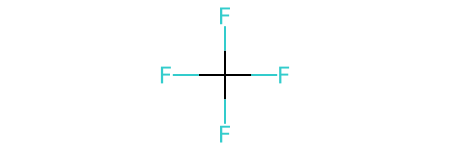

In [ ]:
mols_5_lowest[3]

In [ ]:
import mols2grid


In [ ]:
mols2grid.display(mols_5_lowest)

In [ ]:
from rdkit.Chem import Draw #RDKit drawing

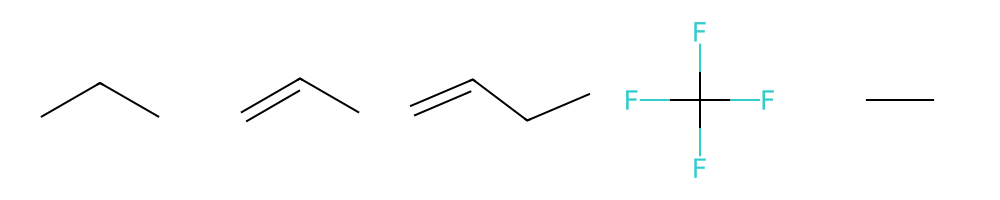

In [ ]:
Draw.MolsToGridImage(mols_5_lowest,molsPerRow=5,useSVG=True)

In [ ]:
mols_5_highest = [Chem.MolFromSmiles(smi) for smi in data_mp['smiles'][indices_5_highest]]

In [ ]:

mols2grid.display(mols_5_highest)

In [ ]:
# by passing the dataframe, and giving the column with the SMILES string, we can
# plot all molecules
mols2grid.display(data_mp, smiles_col='smiles')

In [ ]:
# by passing the dataframe, and giving the column with the SMILES string, we can
# plot all molecules
# we can also add information to the figures by using the subset variable
mols2grid.display(data_mp,smiles_col='smiles',subset=['img','name','smiles','mpC'])

In [ ]:
# by passing the dataframe, and giving the column with the SMILES string, we can
# plot all molecules
# we can also add information to the figures by using the subset variable
mols2grid.display(data_mp.iloc[indices_5_highest],smiles_col='smiles',subset=['img','name','mpC'])

In [ ]:
# by passing the dataframe, and giving the column with the SMILES string, we can
# plot all molecules
# we can also add information to the figures by using the subset variable
mols2grid.display(data_mp.iloc[indices_5_lowest],smiles_col='smiles',subset=['img','name','mpC'])

In [ ]:
# by passing the dataframe, and giving the column with the SMILES string, we can
# plot all molecules
# we can also add information to the figures by using the subset variable
# Here we also format the string for the melting point to show the C.

def mp_str(x):
    return f'{x:.2f} C'

mols2grid.display(data_mp.iloc[indices_5_highest],
                  smiles_col='smiles',
                  subset=['img','name','mpC'],
                  transform={"mpC": mp_str})

In [ ]:
from rdkit.Chem import Descriptors

def number_of_rotatable_bonds(smi):
  mol = Chem.MolFromSmiles(smi)
  if mol is not None:
    return Descriptors.NumRotatableBonds(mol)
  else:
    return np.nan

def molecular_weight(smi):
  mol = Chem.MolFromSmiles(smi)
  if mol is not None:
    return Descriptors.MolWt(mol)
  else:
    return np.nan


In [ ]:
# here we calculate some property and add that to the dataframe
data_mp['NumRotatableBond'] = [number_of_rotatable_bonds(smi) for smi in data_mp['smiles']]
data_mp['MW'] = [molecular_weight(smi) for smi in data_mp['smiles']]

[04:23:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:29] Can't kekulize mol.  Unkekuliz

In [ ]:
data_mp

,key,name,smiles,mpC,csid,link,source,count,min,max,range,NumRotatableBond,MW
0,27956,cyclobutylmethane,C1(CCC1)C,-161.51,11232,http://pubs.acs.org/doi/abs/10.1021/ja01142a048,Lemaire HP; Livingston RL Journal of the Ameri...,2,-161.51,-161.5,0.01,0.0,70.135
1,16005,Nitrogen oxide,[O-][N+]#N,-90.80,923,http://msds.chem.ox.ac.uk/,academic website,2,-90.81,-90.8,0.01,0.0,44.013
2,16127,Sulfuryl difluoride,FS(F)(=O)=O,-135.80,16647,http://msds.chem.ox.ac.uk/,academic website,2,-135.82,-135.8,0.02,0.0,102.061
3,17138,disopyramide,CC(C)N(CCC(c1ccccn1)(c2ccccc2)C(N)=O)C(C)C,94.80,3002,http://dx.doi.org/10.1021/ci700307p,Hughes LD; Palmer DS; Nigsch F and Mitchell JB...,2,94.75,94.8,0.05,8.0,339.483
4,15628,Bromine,BrBr,-7.20,22817,http://msds.chem.ox.ac.uk/,academic website,2,-7.25,-7.2,0.05,0.0,159.808
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3036,27698,4-Nitrobenzoic acid,C1=CC(=CC=C1C(=O)O)[N+](=O)[O-],240.00,5882,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,6,237.00,242.0,5.00,2.0,167.120
3037,28584,Thalidomide,C1CC(=O)NC(=O)C1N2C(=O)C3=CC=CC=C3C2=O,275.00,5233,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,7,270.00,275.0,5.00,1.0,258.233
3038,28068,Estradiol,C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@@H]2O)CCC4=C3...,176.00,5554,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,7,173.00,178.0,5.00,0.0,272.388
3039,27580,"2,4,6-Trichlorophenol",C1=C(C=C(C(=C1Cl)O)Cl)Cl,65.00,21106172,http://dx.doi.org/10.1016/j.chemosphere.2013.1...,Abraham M.H. and Acree Jr. W.E. The solubility...,9,65.00,70.0,5.00,0.0,197.448


In [ ]:
def mp_str(x):
    return f'{x:.2f} C'

def mw_str(x):
    return f'{x:.2f} Da'

def number_of_rotatable_bonds_str(x):
    return f'Rotatable bonds: {x:.0f}'

mols2grid.display(data_mp,smiles_col='smiles',
                  subset=['name','MW','NumRotatableBond','mpC'],
                  transform={'mpC': mp_str, 'MW': mw_str, 'NumRotatableBond': number_of_rotatable_bonds_str}
                  )

In [ ]:
# def tpsa(smi, includeSandP=False):
#   mol = Chem.MolFromSmiles(smi)
#   if mol is not None:
#     if includeSandP:
#       return Descriptors.TPSA(mol,includeSandP=True)
#     else
#       return Descriptors.TPSA(mol)
#   else:
#     return np.nan

def tpsa(smi, withSandP=False):
  mol = Chem.MolFromSmiles(smi)
  if mol is not None:
    return Descriptors.TPSA(mol,includeSandP=withSandP)
  else:
    return np.nan


In [ ]:
data_mp['TPSA'] = [tpsa(smi) for smi in data_mp['smiles']]
data_mp['TPSA_SP'] = [tpsa(smi, withSandP=True) for smi in data_mp['smiles']]

[04:23:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:31] Can't kekulize mol.  Unkekuliz

In [ ]:
data_mp[ ['TPSA','TPSA_SP'] ]

,TPSA,TPSA_SP
0,0.00,0.00
1,51.21,51.21
2,34.14,42.52
3,59.22,59.22
4,0.00,0.00
...,...,...
3036,80.44,80.44
3037,83.55,83.55
3038,40.46,40.46
3039,20.23,20.23


In [ ]:
def mp_str(x):
    return f'{x:.2f} C'

def mw_str(x):
    return f'{x:.2f} Da'

def number_of_rotatable_bonds_str(x):
    return f'Rotatable bonds: {x:.0f}'

def tpsa_str(x):
    return f'TPSA: {x:.1f} A^2'

def tpsa_sp_str(x):
    return f'TPSA_SP: {x:.1f} A^2'

mols2grid.display(data_mp,smiles_col='smiles',
                  subset=['name','MW','NumRotatableBond','mpC','TPSA', 'TPSA_SP'],
                  transform={'mpC': mp_str,
                             'MW': mw_str,
                             'NumRotatableBond': number_of_rotatable_bonds_str,
                             'TPSA': tpsa_str,
                             'TPSA_SP': tpsa_sp_str}
                  )

In [ ]:
data_mp['name']

,name
0,cyclobutylmethane
1,Nitrogen oxide
2,Sulfuryl difluoride
3,disopyramide
4,Bromine
...,...
3036,4-Nitrobenzoic acid
3037,Thalidomide
3038,Estradiol
3039,"2,4,6-Trichlorophenol"


#### How to filter out molecules with NaN values

In [ ]:
nan_mask = np.isnan(data_mp['MW'].to_numpy())

data_mp.iloc[np.logical_not(nan_mask)]

data_mp_ignore_nan = data_mp.iloc[np.logical_not(nan_mask)]

In [ ]:
data_mp.describe()

,key,mpC,csid,count,min,max,range,NumRotatableBond,MW,TPSA,TPSA_SP
count,3041.000000,3041.000000,3.041000e+03,3041.000000,3041.000000,3041.000000,3041.000000,3025.000000,3025.000000,3025.000000,3025.000000
mean,10771.570865,62.848159,2.027796e+06,2.798422,62.229536,63.879092,1.649556,2.296860,180.528716,33.417812,35.766912
std,6875.518120,96.007422,5.474893e+06,1.275456,95.877685,96.229485,1.293567,3.439933,80.114001,27.943325,29.244735
min,10.000000,-188.000000,1.800000e+01,2.000000,-188.000000,-187.600000,0.010000,0.000000,16.043000,0.000000,0.000000
25%,5148.000000,5.000000,7.634000e+03,2.000000,4.800000,5.600000,0.500000,0.000000,129.247000,12.890000,17.070000
50%,13103.000000,64.000000,1.282900e+04,2.000000,62.750000,65.000000,1.000000,1.000000,166.180000,29.460000,34.140000
75%,15269.000000,129.500000,6.675900e+04,3.000000,129.000000,130.800000,2.500000,3.000000,214.648000,47.580000,51.480000
max,28644.000000,438.000000,2.142902e+07,16.000000,437.300000,440.000000,5.000000,47.000000,959.171000,221.290000,237.750000


In [ ]:
data_mp_ignore_nan.describe()

,key,mpC,csid,count,min,max,range,NumRotatableBond,MW,TPSA,TPSA_SP
count,3025.000000,3025.000000,3.025000e+03,3025.000000,3025.000000,3025.000000,3025.000000,3025.000000,3025.000000,3025.000000,3025.000000
mean,10746.770248,62.254496,2.036780e+06,2.798678,61.636536,63.284635,1.648099,2.296860,180.528716,33.417812,35.766912
std,6885.046638,95.663463,5.487405e+06,1.278174,95.537341,95.885451,1.291075,3.439933,80.114001,27.943325,29.244735
min,10.000000,-188.000000,1.800000e+01,2.000000,-188.000000,-187.600000,0.010000,0.000000,16.043000,0.000000,0.000000
25%,5112.000000,5.000000,7.659000e+03,2.000000,4.500000,5.500000,0.500000,0.000000,129.247000,12.890000,17.070000
50%,12815.000000,63.000000,1.285800e+04,2.000000,62.000000,64.500000,1.000000,1.000000,166.180000,29.460000,34.140000
75%,15264.000000,129.000000,6.684700e+04,3.000000,128.000000,130.000000,2.500000,3.000000,214.648000,47.580000,51.480000
max,28644.000000,438.000000,2.142902e+07,16.000000,437.300000,440.000000,5.000000,47.000000,959.171000,221.290000,237.750000


In [ ]:
melting_point_c = data_mp['mpC'].to_numpy()
molecular_weight = data_mp['MW'].to_numpy()

nan_mask = np.isnan(molecular_weight)

molecular_weight_wo_nan = molecular_weight[np.logical_not(nan_mask)]
melting_point_c_wo_nan = melting_point_c[~(nan_mask)]




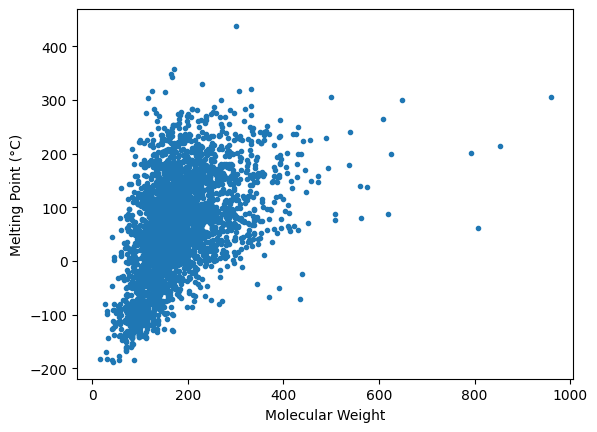

In [ ]:
import matplotlib.pyplot as plt

plt.plot(molecular_weight, melting_point_c, '.')
plt.xlabel("Molecular Weight")
plt.ylabel("Melting Point (°C)")
plt.show()


In [ ]:
!head BradleyDoublePlusGoodMeltingPointDataset.csv

key,name,smiles,mpC,csid,link,source,count,min,max,range
27956,cyclobutylmethane,C1(CCC1)C,-161.51,11232,http://pubs.acs.org/doi/abs/10.1021/ja01142a048,Lemaire HP; Livingston RL Journal of the American Chemical Society; 74(22); 5732-5736 (1952),2,-161.51,-161.5,0.009999999999990905
16005,Nitrogen oxide,[O-][N+]#N,-90.8,923,http://msds.chem.ox.ac.uk/,academic website,2,-90.81,-90.8,0.010000000000005116
16127,Sulfuryl difluoride,FS(F)(=O)=O,-135.8,16647,http://msds.chem.ox.ac.uk/,academic website,2,-135.82,-135.8,0.01999999999998181
17138,disopyramide,CC(C)N(CCC(c1ccccn1)(c2ccccc2)C(N)=O)C(C)C,94.8,3002,http://dx.doi.org/10.1021/ci700307p,Hughes LD; Palmer DS; Nigsch F and Mitchell JBO. 2008 Why are some properties more difficult to predict than others? A study of QSPR models of solubility; melting point and LogP. J. Chem. Inf. Model. 2008. 48 (1). pp 220?285,2,94.75,94.8,0.04999999999999716
15628,Bromine,BrBr,-7.2,22817,http://msds.chem.ox.ac.uk/,academic website,2,-7.25,-7.2,0.0499999

In [ ]:
data_mp_ignore_nan.to_csv("test-all.csv",index=False)

In [ ]:
!head test-all.csv

key,name,smiles,mpC,csid,link,source,count,min,max,range,NumRotatableBond,MW,TPSA,TPSA_SP
27956,cyclobutylmethane,C1(CCC1)C,-161.51,11232,http://pubs.acs.org/doi/abs/10.1021/ja01142a048,Lemaire HP; Livingston RL Journal of the American Chemical Society; 74(22); 5732-5736 (1952),2,-161.51,-161.5,0.0099999999999909,0.0,70.135,0.0,0.0
16005,Nitrogen oxide,[O-][N+]#N,-90.8,923,http://msds.chem.ox.ac.uk/,academic website,2,-90.81,-90.8,0.0100000000000051,0.0,44.013,51.209999999999994,51.209999999999994
16127,Sulfuryl difluoride,FS(F)(=O)=O,-135.8,16647,http://msds.chem.ox.ac.uk/,academic website,2,-135.82,-135.8,0.0199999999999818,0.0,102.06099999999999,34.14,42.52
17138,disopyramide,CC(C)N(CCC(c1ccccn1)(c2ccccc2)C(N)=O)C(C)C,94.8,3002,http://dx.doi.org/10.1021/ci700307p,Hughes LD; Palmer DS; Nigsch F and Mitchell JBO. 2008 Why are some properties more difficult to predict than others? A study of QSPR models of solubility; melting point and LogP. J. Chem. Inf. Model. 2008. 48 (1). pp 220?28

In [ ]:
data_mp_ignore_nan[ ['key','name','MW','TPSA'] ].to_csv("test-subset.csv",index=False)

In [ ]:
!head test-subset.csv

key,name,MW,TPSA
27956,cyclobutylmethane,70.135,0.0
16005,Nitrogen oxide,44.013,51.209999999999994
16127,Sulfuryl difluoride,102.06099999999999,34.14
17138,disopyramide,339.4830000000002,59.220000000000006
15628,Bromine,159.808,0.0
16624,Lomefloxacin,351.3530000000001,74.57
15962,"N,N-Dimethylmethanamine",59.111999999999995,3.24
16135,Tetrachloromethane,153.823,0.0
15862,Iodine,253.808,0.0


In [ ]:
def number_of_heavy_atoms(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        return mol.GetNumHeavyAtoms()
    else:
        return np.nan


In [ ]:
data_mp['HeavyAtoms'] = [number_of_heavy_atoms(smi) for smi in data_mp['smiles']]


[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:33] Can't kekulize mol.  Unkekuliz

In [ ]:
# Select 5 lowest and 5 highest melting point compounds
extreme_mp = pd.concat([
    data_mp.nsmallest(5, 'mpC'),
    data_mp.nlargest(5, 'mpC')
])

# Display heavy atoms for these compounds
extreme_mp[['name', 'smiles', 'mpC', 'HeavyAtoms']]


,name,smiles,mpC,HeavyAtoms
375,Propane,CCC,-188.00,3.0
102,Prop-1-ene,C=CC,-185.00,3.0
303,But-1-ene,C=CCC,-185.00,4.0
345,Tetrafluoromethane,FC(F)(F)F,-184.00,5.0
821,ethane,CC,-183.33,2.0
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.00,24.0
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.00,11.0
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.00,12.0
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.00,12.0
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.50,14.0


In [ ]:
def number_of_hbond_donors(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        return Descriptors.NumHDonors(mol)
    else:
        return np.nan

data_mp['HBD'] = [number_of_hbond_donors(smi) for smi in data_mp['smiles']]


[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:33] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:34] Can't kekulize mol.  Unkekuliz

In [ ]:
data_mp['HBD'] = [number_of_hbond_donors(smi) for smi in data_mp['smiles']]


[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:35] Can't kekulize mol.  Unkekuliz

In [ ]:
data_mp[['name', 'smiles', 'mpC', 'HBD']].head()


,name,smiles,mpC,HBD
0,cyclobutylmethane,C1(CCC1)C,-161.51,0.0
1,Nitrogen oxide,[O-][N+]#N,-90.80,0.0
2,Sulfuryl difluoride,FS(F)(=O)=O,-135.80,0.0
3,disopyramide,CC(C)N(CCC(c1ccccn1)(c2ccccc2)C(N)=O)C(C)C,94.80,1.0
4,Bromine,BrBr,-7.20,0.0


In [ ]:
extreme_mp = pd.concat([
    data_mp.nsmallest(5, 'mpC'),
    data_mp.nlargest(5, 'mpC')
])

extreme_mp[['name', 'smiles', 'mpC', 'HBD']]


,name,smiles,mpC,HBD
375,Propane,CCC,-188.00,0.0
102,Prop-1-ene,C=CC,-185.00,0.0
303,But-1-ene,C=CCC,-185.00,0.0
345,Tetrafluoromethane,FC(F)(F)F,-184.00,0.0
821,ethane,CC,-183.33,0.0
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.00,0.0
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.00,2.0
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.00,2.0
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.00,2.0
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.50,1.0


In [ ]:
# HBA (Hydrogen Bond Acceptors)

def number_of_hbond_acceptors(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        return Descriptors.NumHAcceptors(mol)
    else:
        return np.nan

# Add HBA column to the full dataset
data_mp['HBA'] = [number_of_hbond_acceptors(smi) for smi in data_mp['smiles']]

# Select 5 lowest and 5 highest melting points
extreme_mp = pd.concat([
    data_mp.nsmallest(5, 'mpC'),
    data_mp.nlargest(5, 'mpC')
])

# Show only what you need
extreme_mp[['name', 'smiles', 'mpC', 'HBA']]


[04:23:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:35] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:36] Can't kekulize mol.  Unkekuliz

,name,smiles,mpC,HBA
375,Propane,CCC,-188.00,0.0
102,Prop-1-ene,C=CC,-185.00,0.0
303,But-1-ene,C=CCC,-185.00,0.0
345,Tetrafluoromethane,FC(F)(F)F,-184.00,0.0
821,ethane,CC,-183.33,0.0
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.00,0.0
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.00,3.0
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.00,4.0
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.00,2.0
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.50,3.0


In [ ]:
# LogP (Octanol–water partition coefficient)

def calculate_logp(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        return Descriptors.MolLogP(mol)
    else:
        return np.nan

# Add LogP column to the full dataset
data_mp['LogP'] = [calculate_logp(smi) for smi in data_mp['smiles']]

# Select 5 lowest and 5 highest melting point compounds
extreme_mp = pd.concat([
    data_mp.nsmallest(5, 'mpC'),
    data_mp.nlargest(5, 'mpC')
])

# Display relevant columns
extreme_mp[['name', 'smiles', 'mpC', 'LogP']]


[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:37] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:37] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:37] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:38] Can't kekulize mol.  Unkekuliz

,name,smiles,mpC,LogP
375,Propane,CCC,-188.00,1.4163
102,Prop-1-ene,C=CC,-185.00,1.1923
303,But-1-ene,C=CCC,-185.00,1.5824
345,Tetrafluoromethane,FC(F)(F)F,-184.00,1.4757
821,ethane,CC,-183.33,1.0262
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.00,6.9192
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.00,1.1445
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.00,-0.9936
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.00,1.0830
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.50,1.8726


In [ ]:
# TPSA (Topological Polar Surface Area)

def calculate_tpsa(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        return Descriptors.TPSA(mol)
    else:
        return np.nan

# Add TPSA column to the full dataset
data_mp['TPSA'] = [calculate_tpsa(smi) for smi in data_mp['smiles']]

# Select 5 lowest and 5 highest melting point compounds
extreme_mp = pd.concat([
    data_mp.nsmallest(5, 'mpC'),
    data_mp.nlargest(5, 'mpC')
])

# Display relevant columns
extreme_mp[['name', 'smiles', 'mpC', 'TPSA']]


[04:23:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekuliz

,name,smiles,mpC,TPSA
375,Propane,CCC,-188.00,0.00
102,Prop-1-ene,C=CC,-185.00,0.00
303,But-1-ene,C=CCC,-185.00,0.00
345,Tetrafluoromethane,FC(F)(F)F,-184.00,0.00
821,ethane,CC,-183.33,0.00
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.00,0.00
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.00,74.60
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.00,91.50
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.00,74.60
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.50,58.53


In [ ]:
# TPSA including sulfur (S) and phosphorus (P) atoms

from rdkit.Chem import rdMolDescriptors

def calculate_tpsa_sp(smi):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        return rdMolDescriptors.CalcTPSA(mol, includeSandP=True)
    else:
        return np.nan

# Add TPSA_S_P column to the full dataset
data_mp['TPSA_S_P'] = [calculate_tpsa_sp(smi) for smi in data_mp['smiles']]

# Select 5 lowest and 5 highest melting point compounds
extreme_mp = pd.concat([
    data_mp.nsmallest(5, 'mpC'),
    data_mp.nlargest(5, 'mpC')
])

# Display relevant columns
extreme_mp[['name', 'smiles', 'mpC', 'TPSA_S_P']]


[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekuliz

,name,smiles,mpC,TPSA_S_P
375,Propane,CCC,-188.00,0.00
102,Prop-1-ene,C=CC,-185.00,0.00
303,But-1-ene,C=CCC,-185.00,0.00
345,Tetrafluoromethane,FC(F)(F)F,-184.00,0.00
821,ethane,CC,-183.33,0.00
2384,Coronene,C1=CC2=C3C4=C1C=CC5=C4C6=C(C=C5)C=CC7=C6C3=C(C...,438.00,0.00
1075,"thiophene-2,5-dicarboxylic acid",c1cc(sc1C(=O)O)C(=O)O,358.00,102.84
482,"2,4-dihydroxypteridine",c1cnc2c(n1)c(=O)[nH]c(=O)[nH]2,348.00,91.50
2952,isophthalic_acid,OC(=O)c1cccc(c1)C(=O)O,342.00,74.60
2639,Diazoxide,Clc1ccc2NC(C)=NS(=O)(=O)c2c1,330.50,66.91


In [ ]:
from rdkit import Chem
from rdkit.Chem import Descriptors, rdMolDescriptors
import numpy as np
import pandas as pd

# 1) Convert SMILES to RDKit mol and drop failures
data_mp["mol"] = data_mp["smiles"].apply(Chem.MolFromSmiles)
data_clean = data_mp.dropna(subset=["mol"]).copy()

# 2) Compute all properties (B)
data_clean["MW"] = data_clean["mol"].apply(Descriptors.MolWt)
data_clean["HeavyAtoms"] = data_clean["mol"].apply(lambda m: m.GetNumHeavyAtoms())
data_clean["HBA"] = data_clean["mol"].apply(Descriptors.NumHAcceptors)
data_clean["HBD"] = data_clean["mol"].apply(Descriptors.NumHDonors)
data_clean["LogP"] = data_clean["mol"].apply(Descriptors.MolLogP)
data_clean["TPSA"] = data_clean["mol"].apply(Descriptors.TPSA)
data_clean["TPSA_S_P"] = data_clean["mol"].apply(lambda m: rdMolDescriptors.CalcTPSA(m, includeSandP=True))

# 3) Select columns to write
out_cols = ["name", "smiles", "mpC", "MW", "HeavyAtoms", "HBA", "HBD", "LogP", "TPSA", "TPSA_S_P"]
output_df = data_clean[out_cols].copy()

# 4) Write to CSV
output_df.to_csv("bradley_mp_with_descriptors.csv", index=False)

print("Saved file: bradley_mp_with_descriptors.csv")
print("Rows written:", len(output_df))


[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 31 32 33 34
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12 13 14 15 16
[04:23:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[04:23:40] Can't kekulize mol.  Unkekuliz

Saved file: bradley_mp_with_descriptors.csv
Rows written: 3025


In [ ]:
from google.colab import files
files.download("bradley_mp_with_descriptors.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

mpC 10th percentile cutoff: -77.60
mpC 90th percentile cutoff: 182.00
Rows before mpC filter: 3025
Rows after  mpC filter: 2425


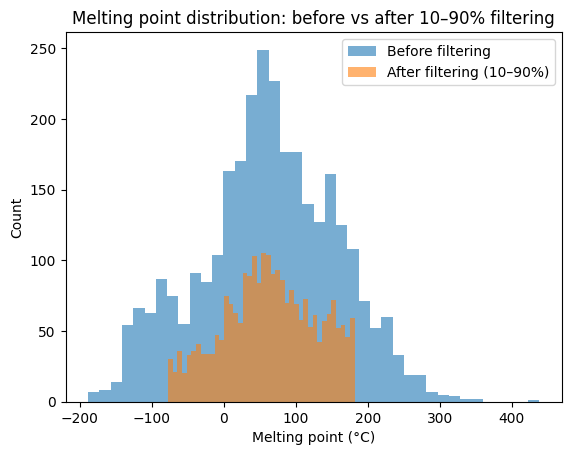

In [ ]:
#D

# Choose the dataframe that has mpC + descriptors (from Part C)
# If you used output_df in Part C, use that. Otherwise use data_mp (must contain descriptors).
df = output_df.copy()  # <-- change to data_mp if needed

# Make sure mpC is numeric and drop missing
df["mpC"] = pd.to_numeric(df["mpC"], errors="coerce")
df = df.dropna(subset=["mpC"]).copy()

# 10% / 90% cutoffs for melting point
mp_lo = df["mpC"].quantile(0.10)
mp_hi = df["mpC"].quantile(0.90)

# Filter to middle 80%
df_mp80 = df[(df["mpC"] >= mp_lo) & (df["mpC"] <= mp_hi)].copy()

print(f"mpC 10th percentile cutoff: {mp_lo:.2f}")
print(f"mpC 90th percentile cutoff: {mp_hi:.2f}")
print(f"Rows before mpC filter: {len(df)}")
print(f"Rows after  mpC filter: {len(df_mp80)}")

# Histogram: before vs after
plt.figure()
plt.hist(df["mpC"].dropna(), bins=40, alpha=0.6, label="Before filtering")
plt.hist(df_mp80["mpC"].dropna(), bins=40, alpha=0.6, label="After filtering (10–90%)")
plt.xlabel("Melting point (°C)")
plt.ylabel("Count")
plt.legend()
plt.title("Melting point distribution: before vs after 10–90% filtering")
plt.show()


MW 10th percentile cutoff: 110.20
MW 90th percentile cutoff: 274.37
Rows before MW filter: 2425
Rows after  MW filter: 1941


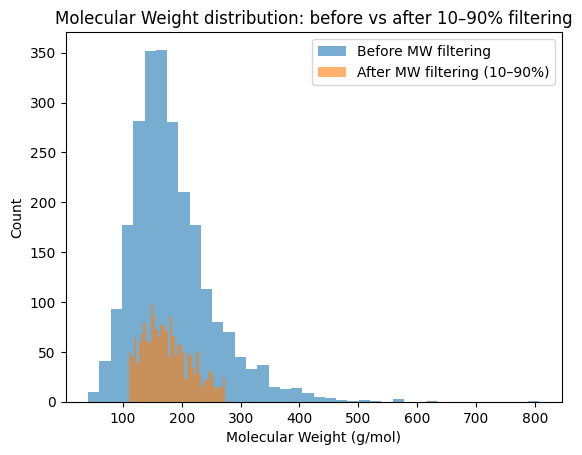

In [ ]:
import matplotlib.pyplot as plt

# Start from the mpC-filtered dataset
df_prop = df_mp80.copy()

# Compute 10% / 90% cutoffs for Molecular Weight
mw_lo = df_prop["MW"].quantile(0.10)
mw_hi = df_prop["MW"].quantile(0.90)

# Apply MW filter (middle 80%)
df_mw80 = df_prop[
    (df_prop["MW"] >= mw_lo) & (df_prop["MW"] <= mw_hi)
].copy()

print(f"MW 10th percentile cutoff: {mw_lo:.2f}")
print(f"MW 90th percentile cutoff: {mw_hi:.2f}")
print(f"Rows before MW filter: {len(df_prop)}")
print(f"Rows after  MW filter: {len(df_mw80)}")

# Histogram: before vs after MW filtering
plt.figure()
plt.hist(df_prop["MW"], bins=40, alpha=0.6, label="Before MW filtering")
plt.hist(df_mw80["MW"], bins=40, alpha=0.6, label="After MW filtering (10–90%)")
plt.xlabel("Molecular Weight (g/mol)")
plt.ylabel("Count")
plt.legend()
plt.title("Molecular Weight distribution: before vs after 10–90% filtering")
plt.show()


R² (training): 0.056
R² (test):     0.084


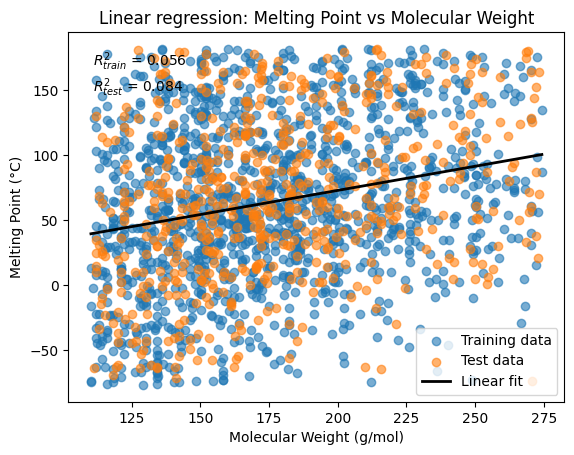

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np

# 1) Define X and y
X = df_mw80[["MW"]].values   # must be 2D for sklearn
y = df_mw80["mpC"].values

# 2) Train / test split (70% / 30%)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42
)

# 3) Fit linear regression
model = LinearRegression()
model.fit(X_train, y_train)

# 4) Predictions
y_train_pred = model.predict(X_train)
y_test_pred  = model.predict(X_test)

# 5) R² scores
r2_train = r2_score(y_train, y_train_pred)
r2_test  = r2_score(y_test, y_test_pred)

print(f"R² (training): {r2_train:.3f}")
print(f"R² (test):     {r2_test:.3f}")

# 6) Plot
plt.figure()

# Training points
plt.scatter(X_train, y_train, alpha=0.6, label="Training data")

# Test points
plt.scatter(X_test, y_test, alpha=0.6, label="Test data")

# Regression line (drawn over full X range)
x_line = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
y_line = model.predict(x_line)
plt.plot(x_line, y_line, color="black", linewidth=2, label="Linear fit")

plt.xlabel("Molecular Weight (g/mol)")
plt.ylabel("Melting Point (°C)")
plt.title("Linear regression: Melting Point vs Molecular Weight")

plt.text(
    0.05, 0.95,
    f"$R^2_{{train}}$ = {r2_train:.3f}\n$R^2_{{test}}$ = {r2_test:.3f}",
    transform=plt.gca().transAxes,
    verticalalignment="top"
)

plt.legend()
plt.show()


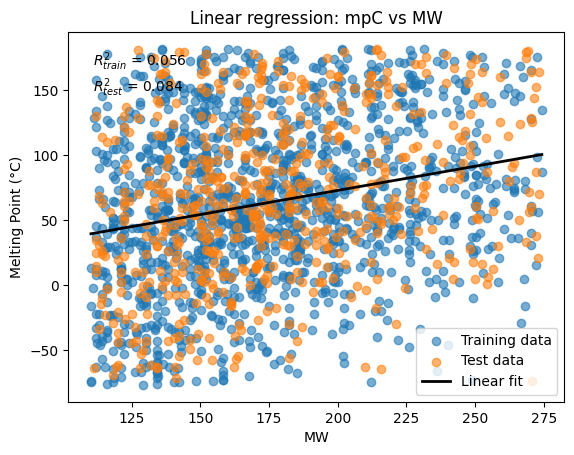

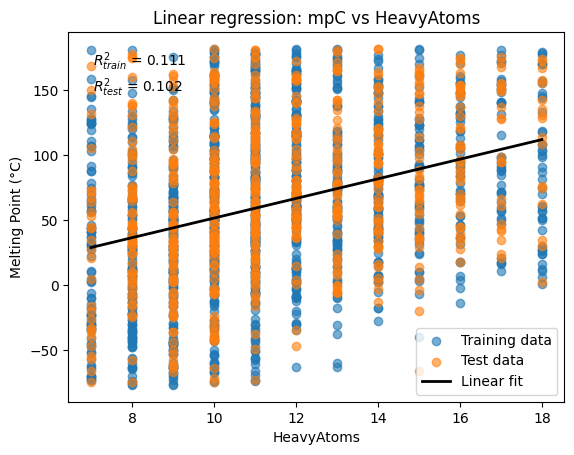

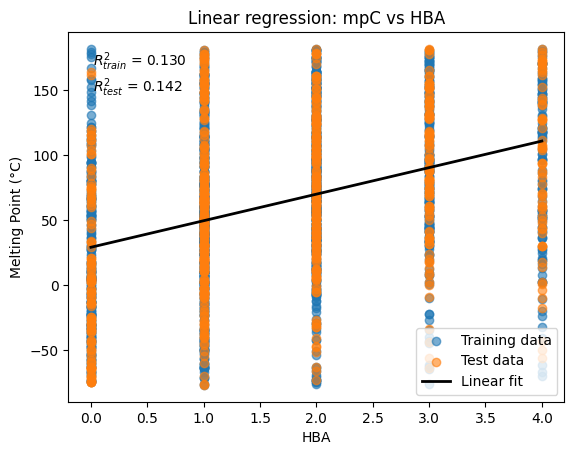

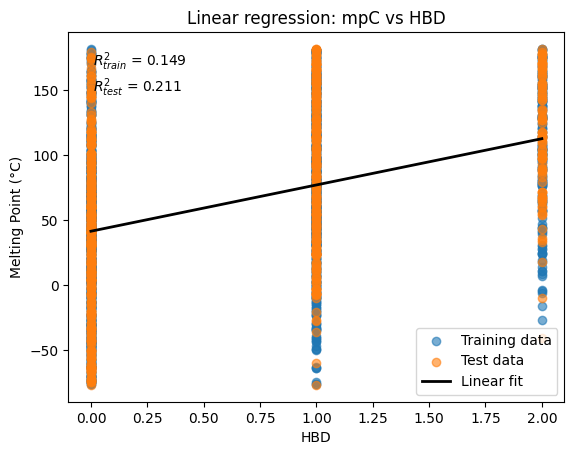

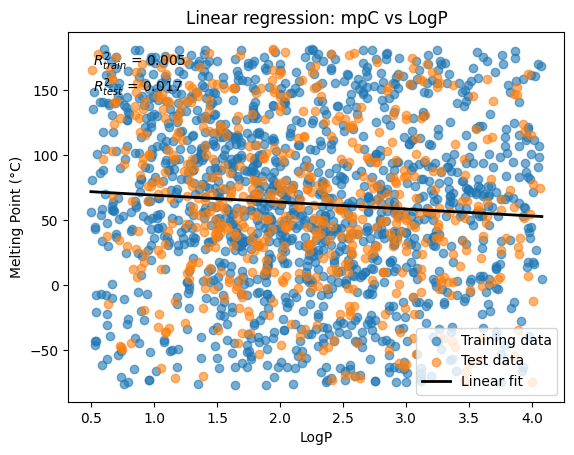

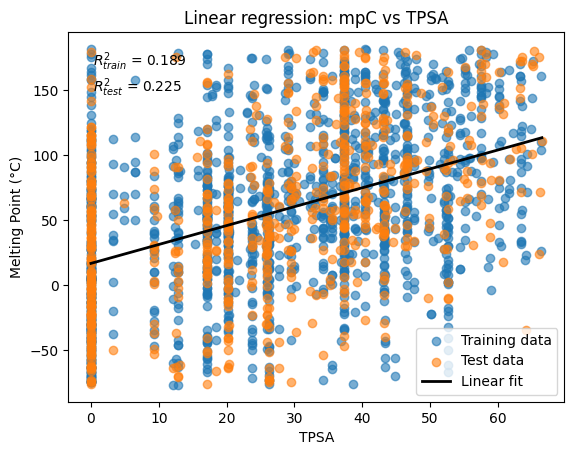

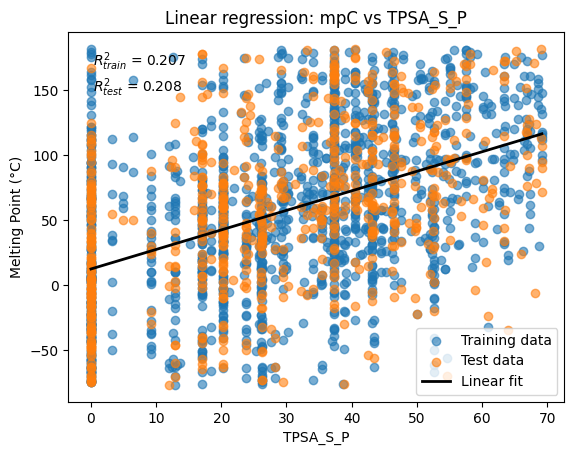

,Property,R2_train,R2_test,N_points
5,TPSA,0.189389,0.224636,2182
3,HBD,0.148759,0.210648,2368
6,TPSA_S_P,0.207139,0.208057,2182
2,HBA,0.129749,0.141601,2331
1,HeavyAtoms,0.111133,0.101780,2018
0,MW,0.055804,0.083986,1941
4,LogP,0.005342,0.017308,1939


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# List of descriptors to analyze
properties = [
    "MW",
    "HeavyAtoms",
    "HBA",
    "HBD",
    "LogP",
    "TPSA",
    "TPSA_S_P"
]

results = []

for prop in properties:
    # --- Step 4a: property-specific 10–90% filtering ---
    df_prop = df_mp80.dropna(subset=[prop]).copy()

    lo = df_prop[prop].quantile(0.10)
    hi = df_prop[prop].quantile(0.90)

    df_prop80 = df_prop[
        (df_prop[prop] >= lo) & (df_prop[prop] <= hi)
    ].copy()

    # --- Step 4b: regression data ---
    X = df_prop80[[prop]].values
    y = df_prop80["mpC"].values

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.30, random_state=42
    )

    model = LinearRegression()
    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test  = r2_score(y_test, y_test_pred)

    # Store results
    results.append({
        "Property": prop,
        "R2_train": r2_train,
        "R2_test": r2_test,
        "N_points": len(df_prop80)
    })

    # --- Step 4c: plot ---
    plt.figure()

    plt.scatter(X_train, y_train, alpha=0.6, label="Training data")
    plt.scatter(X_test, y_test, alpha=0.6, label="Test data")

    x_line = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
    y_line = model.predict(x_line)
    plt.plot(x_line, y_line, color="black", linewidth=2, label="Linear fit")

    plt.xlabel(prop)
    plt.ylabel("Melting Point (°C)")
    plt.title(f"Linear regression: mpC vs {prop}")

    plt.text(
        0.05, 0.95,
        f"$R^2_{{train}}$ = {r2_train:.3f}\n$R^2_{{test}}$ = {r2_test:.3f}",
        transform=plt.gca().transAxes,
        verticalalignment="top"
    )

    plt.legend()
    plt.show()

# --- Step 4d: summary table ---
results_df = pd.DataFrame(results).sort_values("R2_test", ascending=False)
results_df



=== RANSAC for TPSA ===
Property 10th/90th cutoffs: 0.0000, 66.6480
Total points used: 2182
Inliers: 1204 | Outliers: 978
R² on inliers (optional): 0.598


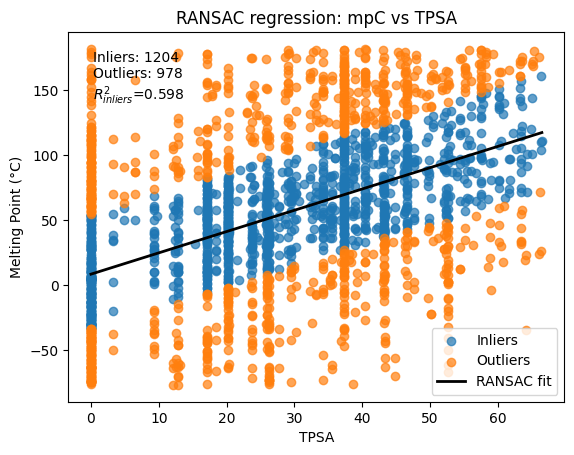


=== RANSAC for HBD ===
Property 10th/90th cutoffs: 0.0000, 2.0000
Total points used: 2368
Inliers: 1312 | Outliers: 1056
R² on inliers (optional): 0.540


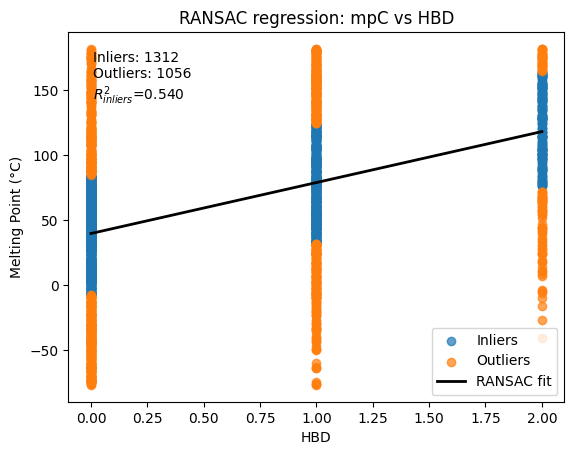

In [ ]:
#E

from sklearn.linear_model import RANSACRegressor, LinearRegression
from sklearn.metrics import r2_score

# --- Best two properties from your Part D results (highest R2_test) ---
props_to_run = ["TPSA", "HBD"]

# Safety check
required_cols = ["mpC"] + props_to_run
missing = [c for c in required_cols if c not in df_mp80.columns]
if missing:
    raise ValueError(f"df_mp80 is missing required columns: {missing}")

for prop in props_to_run:
    # ------------------------------------------------------------
    # 1) Start from mpC-filtered data (df_mp80), then filter property outliers
    # ------------------------------------------------------------
    df_prop = df_mp80.dropna(subset=[prop, "mpC"]).copy()

    lo = df_prop[prop].quantile(0.10)
    hi = df_prop[prop].quantile(0.90)

    df_prop80 = df_prop[(df_prop[prop] >= lo) & (df_prop[prop] <= hi)].copy()

    X = df_prop80[[prop]].values  # shape (n,1)
    y = df_prop80["mpC"].values   # shape (n,)

    # ------------------------------------------------------------
    # 2) Fit RANSAC regression
    # ------------------------------------------------------------
    ransac = RANSACRegressor(
        estimator=LinearRegression(),
        min_samples=0.5,      # can adjust (0.5 means at least half points to form a model)
        random_state=42
    )
    ransac.fit(X, y)

    # Inliers/outliers
    inlier_mask = ransac.inlier_mask_
    outlier_mask = ~inlier_mask

    # Optional: R² on inliers only (often reported; not strictly required)
    y_inliers_pred = ransac.predict(X[inlier_mask])
    r2_inliers = r2_score(y[inlier_mask], y_inliers_pred) if inlier_mask.sum() > 1 else np.nan

    print(f"\n=== RANSAC for {prop} ===")
    print(f"Property 10th/90th cutoffs: {lo:.4f}, {hi:.4f}")
    print(f"Total points used: {len(df_prop80)}")
    print(f"Inliers: {inlier_mask.sum()} | Outliers: {outlier_mask.sum()}")
    print(f"R² on inliers (optional): {r2_inliers:.3f}")

    # ------------------------------------------------------------
    # 3) Plot: inliers vs outliers + RANSAC fit line
    # ------------------------------------------------------------
    plt.figure()

    # Inliers and outliers (different colors)
    plt.scatter(X[inlier_mask], y[inlier_mask], alpha=0.7, label="Inliers")
    plt.scatter(X[outlier_mask], y[outlier_mask], alpha=0.7, label="Outliers")

    # RANSAC regression line
    x_line = np.linspace(X.min(), X.max(), 200).reshape(-1, 1)
    y_line = ransac.predict(x_line)
    plt.plot(x_line, y_line, color="black", linewidth=2, label="RANSAC fit")

    plt.xlabel(prop)
    plt.ylabel("Melting Point (°C)")
    plt.title(f"RANSAC regression: mpC vs {prop}")

    # Put inlier/outlier counts (and optional R²) on the plot
    plt.text(
        0.05, 0.95,
        f"Inliers: {inlier_mask.sum()}\nOutliers: {outlier_mask.sum()}\n$R^2_{{inliers}}$={r2_inliers:.3f}",
        transform=plt.gca().transAxes,
        verticalalignment="top"
    )

    plt.legend()
    plt.show()


### Task 2 - Optional 5 points

Here we will consider a dataset of two variables $x$ and $y$ sampled from a two-dimensional probability density $P(x,y)$ that is unknown.

The dataset is given as a time series in the file `Dataset_RotatedWQ-Potential.data`.

The main task is to perform a Gaussian Mixture Model analysis on this two-dimensional dataset.

#### A)
Plot the dataset, both the time series and also a scatter plot for the $x$ and $y$ variables.

Looking at the scatter plot, how many Gaussian components do you think are needed in the Gaussian Mixture Model analysis?

#### B)
Using Seaborn (or scikit-learn) estimate the two-dimensional probability density $P(x,y)$ using kernel density estimation.

#### C)
Perform a Gaussian Mixture Model analysis for a different number of components, and obtain the Bayesian information criterion (bic) and Akaike information criterion (aic) values and based on them identify the optimal number of components (remember that for both a lower value is better).

#### D)
For the optimal number of components, perform a final Gaussian Mixture Model analysis that you will analyze.

- What is the weight of each Gaussian components.

- What is the percentage of samples that are hard classifed to each cluster.

- Make a scatter plot that shows how the samples are hard classifed to each cluster. In this plot, indicate the center of each Gaussian components.

- Make figures that shows how the samples are soft classifed to each cluster (e.g., the probablity that they belong to a given cluster). In each plot, indicate the center of corresponding Gaussian components.

- Plot a two-dimensional surface of the $P(x,y)$ estimated by the Gaussian Mixture Model. How does this compare to the KDE plot from B)?


In [ ]:
# Bash script to download all the dataset. Don't worry if you don't understand it
%%bash

url="https://raw.githubusercontent.com/valsson-group/UNT-ChemicalApplicationsOfMachineLearning-Spring2026/refs/heads/main/Assignment-2/"
dataset_filename="Dataset_RotatedWQ-Potential.data"

rm -f ${dataset_filename}

wget ${url}/${dataset_filename} &> /dev/null

ls



BradleyDoublePlusGoodMeltingPointDataset.csv
bradley_mp_with_descriptors.csv
Dataset_RotatedWQ-Potential.data
sample_data
test-all.csv
test-subset.csv


In [ ]:
import numpy as np

data = np.loadtxt("Dataset_RotatedWQ-Potential.data")

# Split into x and y
x = data[:, 0]
y = data[:, 1]

print("Data loaded. Shape:", data.shape)

Data loaded. Shape: (10001, 3)


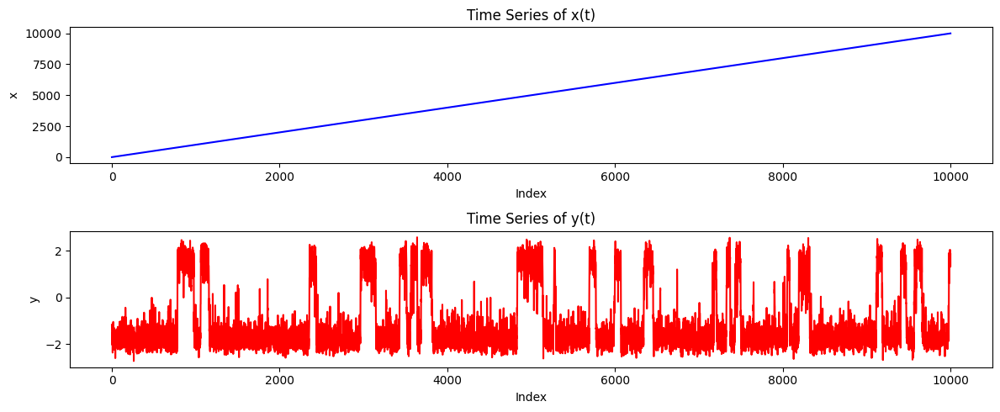

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Plot x(t)
plt.subplot(2, 1, 1)
plt.plot(x, color='blue')
plt.title("Time Series of x(t)")
plt.xlabel("Index")
plt.ylabel("x")

# Plot y(t)
plt.subplot(2, 1, 2)
plt.plot(y, color='red')
plt.title("Time Series of y(t)")
plt.xlabel("Index")
plt.ylabel("y")

plt.tight_layout()
plt.show()

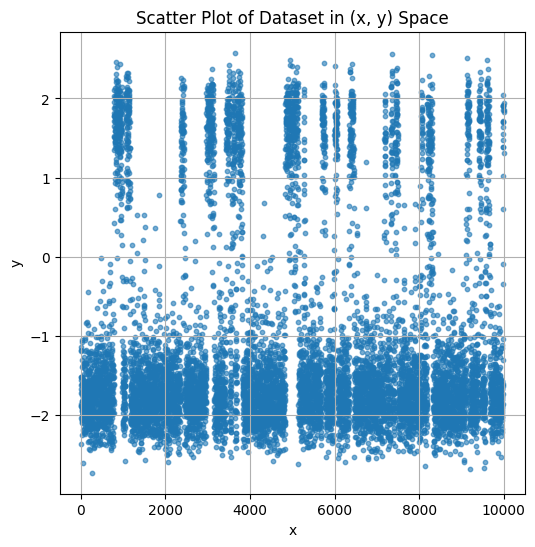

In [ ]:
plt.figure(figsize=(6, 6))

plt.scatter(x, y, s=10, alpha=0.6)
plt.title("Scatter Plot of Dataset in (x, y) Space")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)

plt.show()

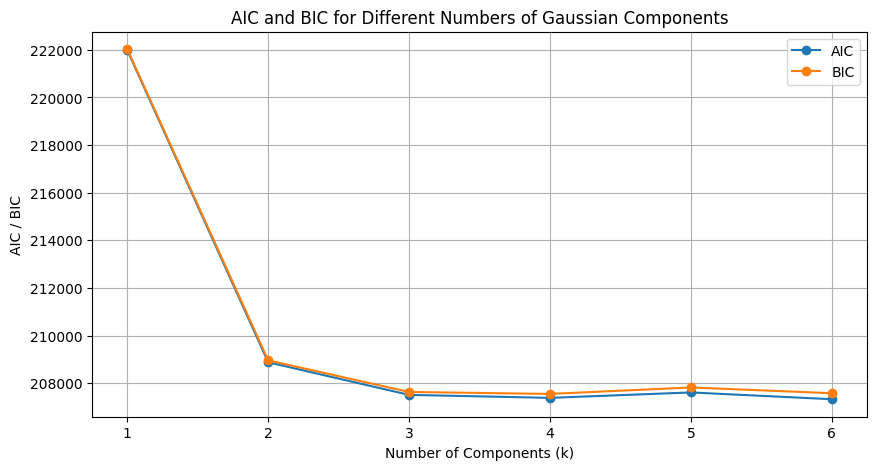

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt

X = np.column_stack((x, y))

aic_values = []
bic_values = []
components_range = range(1, 7)  # test 1 to 6 Gaussians

for k in components_range:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=0)
    gmm.fit(X)
    aic_values.append(gmm.aic(X))
    bic_values.append(gmm.bic(X))

plt.figure(figsize=(10, 5))

plt.plot(components_range, aic_values, marker='o', label='AIC')
plt.plot(components_range, bic_values, marker='o', label='BIC')

plt.title("AIC and BIC for Different Numbers of Gaussian Components")
plt.xlabel("Number of Components (k)")
plt.ylabel("AIC / BIC")
plt.legend()
plt.grid(True)
plt.show()

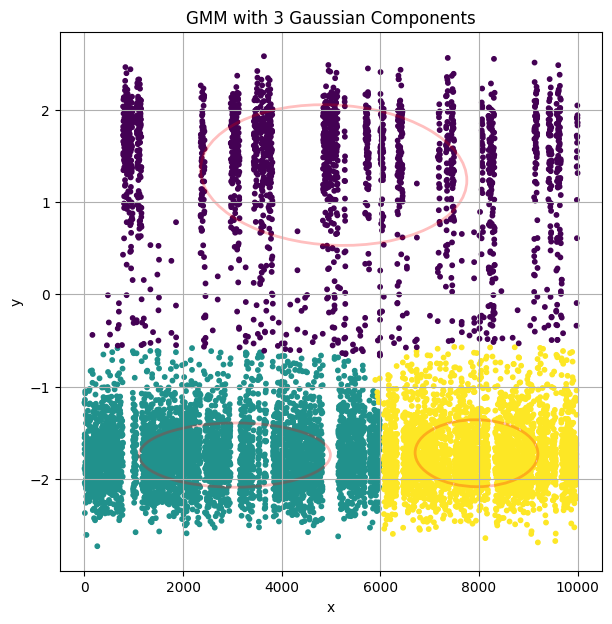

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

# Choose number of components (set this based on your AIC/BIC result)
k = 3   # <-- change this if needed

X = np.column_stack((x, y))

# Fit the GMM
gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=0)
gmm.fit(X)

# Predict cluster labels
labels = gmm.predict(X)

def draw_ellipse(mean, cov, ax, **kwargs):
    """
    Draw a 1-sigma ellipse for a 2D Gaussian with given mean and covariance.
    """
    # Ensure cov is 2x2
    cov = np.asarray(cov)
    if cov.shape != (2, 2):
        raise ValueError(f"Covariance must be 2x2, got shape {cov.shape}")

    # Eigen-decomposition of covariance
    vals, vecs = np.linalg.eigh(cov)
    # Sort eigenvalues and eigenvectors
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]

    # Angle of ellipse in degrees
    angle = np.degrees(np.arctan2(vecs[1, 0], vecs[0, 0]))

    # Width and height are 2 * sqrt(eigenvalues) for 1-sigma
    width, height = 2 * np.sqrt(vals)

    ellipse = Ellipse(xy=mean, width=width, height=height, angle=angle, **kwargs)
    ax.add_patch(ellipse)

# Plot data + ellipses
plt.figure(figsize=(7, 7))
ax = plt.gca()

# Scatter plot colored by cluster
sc = ax.scatter(X[:, 0], X[:, 1], c=labels, s=10, cmap='viridis')

# Draw ellipses for each Gaussian component
for mean, cov in zip(gmm.means_, gmm.covariances_):
    draw_ellipse(mean, cov, ax, alpha=0.25, edgecolor='red', facecolor='none', linewidth=2)

plt.title(f"GMM with {k} Gaussian Components")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.show()

In [ ]:
#B

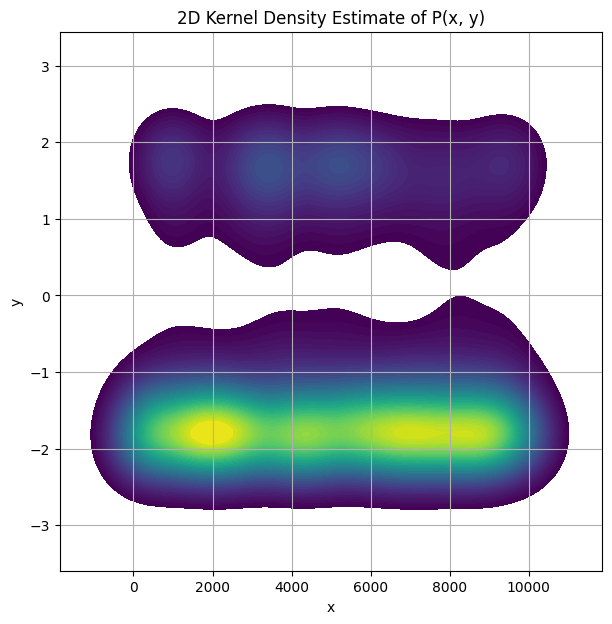

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

X = np.column_stack((x, y))

plt.figure(figsize=(7, 7))

sns.kdeplot(
    x=X[:, 0],
    y=X[:, 1],
    fill=True,
    cmap="viridis",
    thresh=0.05,
    levels=50
)

plt.title("2D Kernel Density Estimate of P(x, y)")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.show()

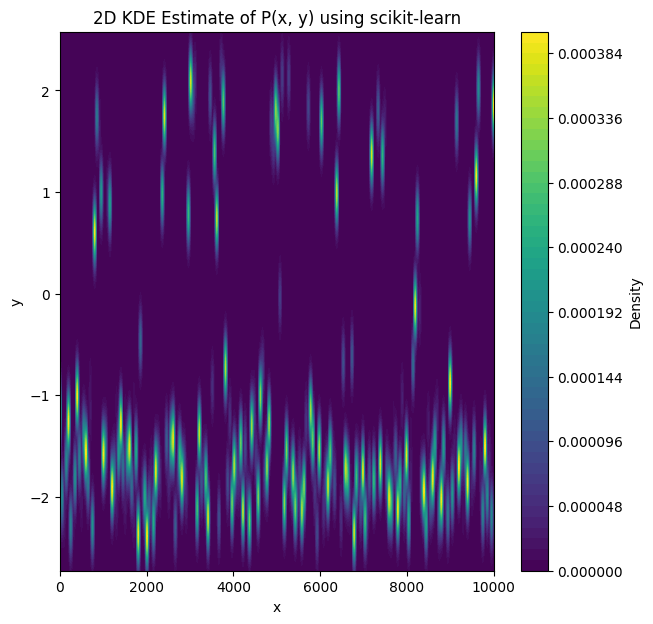

In [ ]:
from sklearn.neighbors import KernelDensity
import numpy as np
import matplotlib.pyplot as plt

X = np.column_stack((x, y))

# Fit KDE
kde = KernelDensity(bandwidth=0.2, kernel='gaussian')
kde.fit(X)

# Create grid for evaluation
xgrid = np.linspace(X[:,0].min(), X[:,0].max(), 200)
ygrid = np.linspace(X[:,1].min(), X[:,1].max(), 200)
xx, yy = np.meshgrid(xgrid, ygrid)
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# Evaluate log-density
log_density = kde.score_samples(grid_points)
density = np.exp(log_density).reshape(xx.shape)

# Plot
plt.figure(figsize=(7, 7))
plt.contourf(xx, yy, density, levels=50, cmap='viridis')
plt.title("2D KDE Estimate of P(x, y) using scikit-learn")
plt.xlabel("x")
plt.ylabel("y")
plt.colorbar(label="Density")
plt.show()

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

X = np.column_stack((x, y))

aic_values = []
bic_values = []
components_range = range(1, 7)  # test 1 to 6 components

for k in components_range:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=0)
    gmm.fit(X)
    aic_values.append(gmm.aic(X))
    bic_values.append(gmm.bic(X))

# Find optimal k
optimal_k_aic = components_range[np.argmin(aic_values)]
optimal_k_bic = components_range[np.argmin(bic_values)]

print("AIC values:", aic_values)
print("BIC values:", bic_values)
print("Optimal number of components (AIC):", optimal_k_aic)
print("Optimal number of components (BIC):", optimal_k_bic)

AIC values: [np.float64(221989.0294721992), np.float64(208882.88985334444), np.float64(207513.37859556172), np.float64(207388.80437668477), np.float64(207615.83639236458), np.float64(207331.4666529047)]
BIC values: [np.float64(222025.0816740341), np.float64(208962.20469738118), np.float64(207635.9560818003), np.float64(207554.64450512524), np.float64(207824.9391630069), np.float64(207583.83206574887)]
Optimal number of components (AIC): 6
Optimal number of components (BIC): 4


In [ ]:
#D
k_opt = optimal_k_bic   # or optimal_k_aic, depending on what you choose


In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np

X = np.column_stack((x, y))

gmm = GaussianMixture(n_components=k_opt, covariance_type='full', random_state=0)
gmm.fit(X)

weights = gmm.weights_
means = gmm.means_
covs = gmm.covariances_

print("Weights of Gaussian components:", weights)
print("Means of Gaussian components:\n", means)

Weights of Gaussian components: [0.07246121 0.14738065 0.056476   0.72368214]
Means of Gaussian components:
 [[ 4.08001462e+03 -2.19258343e-01]
 [ 4.42952316e+03  1.65343864e+00]
 [ 8.93707210e+03 -3.46375432e-01]
 [ 4.90104832e+03 -1.76739467e+00]]


In [ ]:
labels = gmm.predict(X)

unique, counts = np.unique(labels, return_counts=True)
percentages = counts / len(X) * 100

for i, p in zip(unique, percentages):
    print(f"Cluster {i}: {p:.2f}% of samples")

Cluster 0: 4.98% of samples
Cluster 1: 15.63% of samples
Cluster 2: 3.94% of samples
Cluster 3: 75.45% of samples


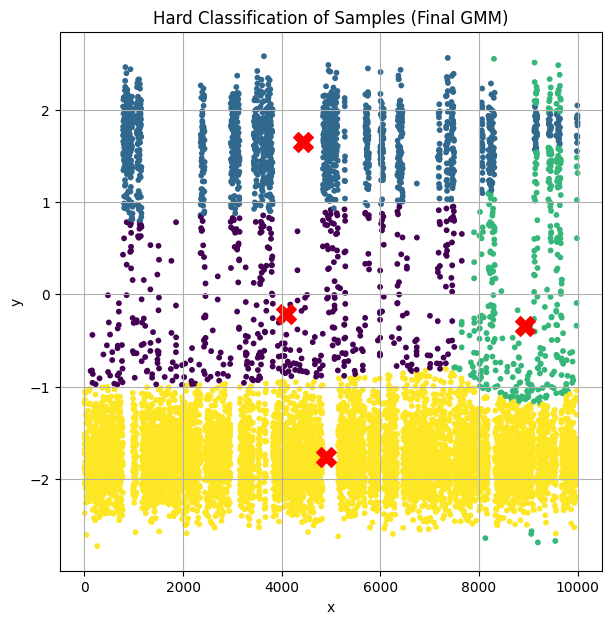

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 7))
plt.scatter(X[:, 0], X[:, 1], c=labels, s=10, cmap='viridis')

# plot centers
plt.scatter(means[:, 0], means[:, 1], c='red', s=200, marker='X')

plt.title("Hard Classification of Samples (Final GMM)")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.show()

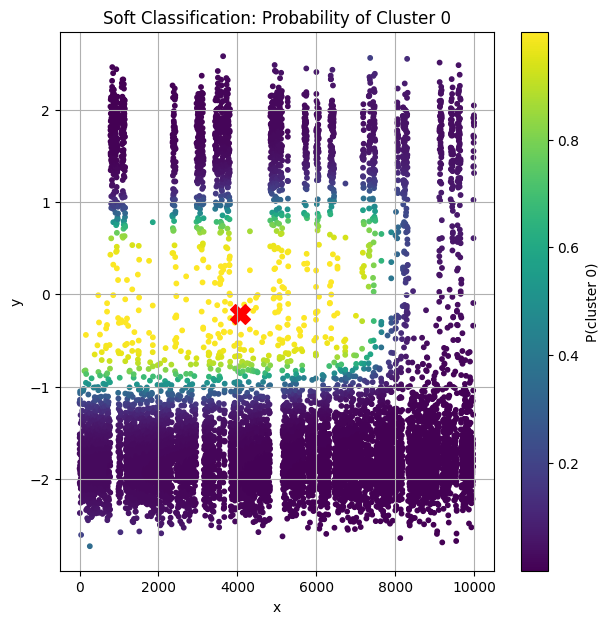

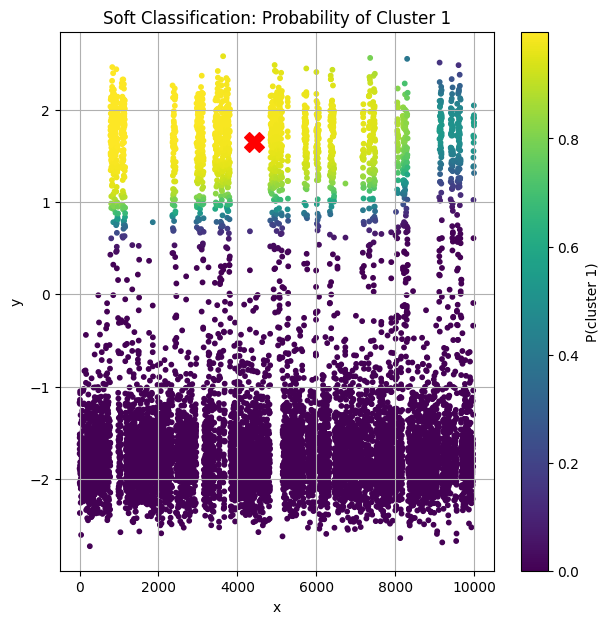

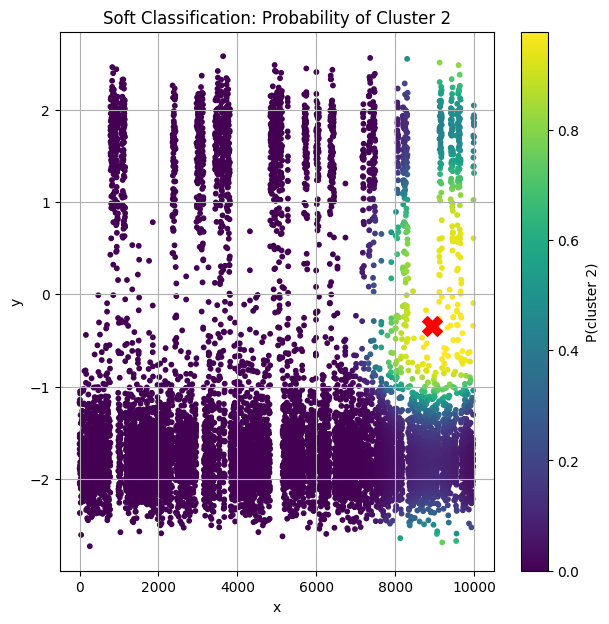

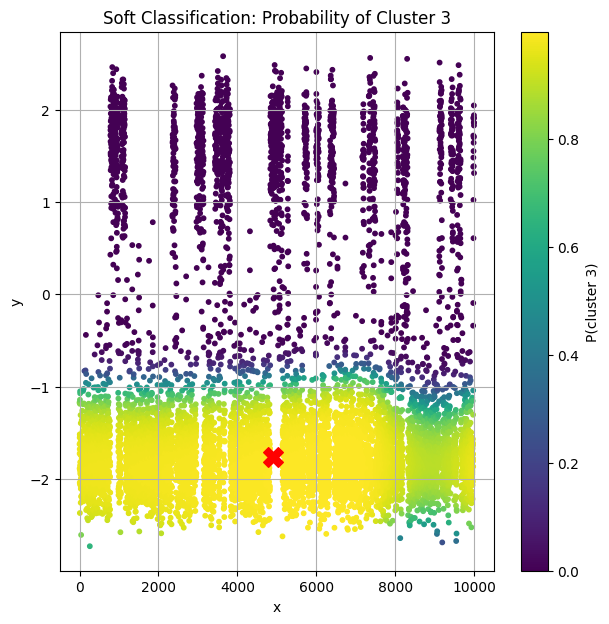

In [ ]:
probs = gmm.predict_proba(X)

for i in range(k_opt):
    plt.figure(figsize=(7, 7))
    plt.scatter(X[:, 0], X[:, 1], c=probs[:, i], cmap='viridis', s=10)
    plt.colorbar(label=f"P(cluster {i})")

    # mark center
    plt.scatter(means[i, 0], means[i, 1], c='red', s=200, marker='X')

    plt.title(f"Soft Classification: Probability of Cluster {i}")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.grid(True)
    plt.show()

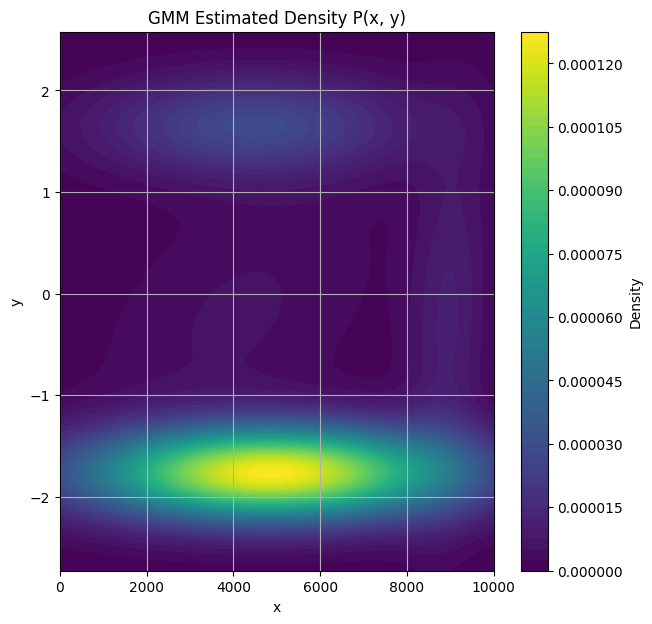

In [ ]:
# grid for evaluation
xgrid = np.linspace(X[:,0].min(), X[:,0].max(), 200)
ygrid = np.linspace(X[:,1].min(), X[:,1].max(), 200)
xx, yy = np.meshgrid(xgrid, ygrid)
grid_points = np.vstack([xx.ravel(), yy.ravel()]).T

# evaluate GMM density
log_prob = gmm.score_samples(grid_points)
density = np.exp(log_prob).reshape(xx.shape)

plt.figure(figsize=(7, 7))
plt.contourf(xx, yy, density, levels=50, cmap='viridis')
plt.colorbar(label="Density")
plt.title("GMM Estimated Density P(x, y)")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.show()